In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# Dataset Description

The dataset contains customer demographic details, subscription information, billing patterns, service usage behavior, and churn-related attributes for a telecom company. 
### Objective:
The objective is to analyze churn behavior and identify the major factors contributing to customer attrition.
### Business goal:
Customer churn directly impacts company revenue and customer lifetime value. By understanding churn patterns, the company can:

1) improve customer retention
2) reduce revenue loss
3) identify high-risk customers
4) optimize service offerings

In [18]:
df=pd.read_csv('Telco_customer_churn.csv')
df.head(2)

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved


In [19]:
df.shape

(7043, 33)

In [20]:
df.columns

Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')

# The datset has different types of variables:

### Geographic Information about the customer
CustomerId: Its a unique value assigned to each customer.

Count: 

Country: Country where the customer resides.

State: State where the customer resides.

City: The customer belongs to which city.

Zip code: Postal ZIP code to the customer location

lat long: Combined latitude and longitude coordinates of customer location.

Latitude, Logitude: Coordinates of customer location.

### Demographic Information of the customer
Gender: Whether the customeer is male or female.

Senior Citizen: Whether the customer is a senior citizen or not.

Partner: whether the customer has a partner or not.

Dependdents: Whether the customer has any dependents or not.

### Customer relationship information
Tenure: It represents the number of months the customer has stayed with the company.

### Phone service information
Phone service: The customer has phone service or not.

Multiple lines: Whether the customer has multiple phone lines or not.

### Internet and Additional Services
Internet Service: Type of internet service subscribed by the customer.

Online Security: ndicates whether online security service is subscribed.

Online Backup: Indicates whether online backup service is subscribed.

Device Protection: Indicates whether device protection service is subscribed.

Tech Support: Indicates whether technical support service is subscribed.

Streaming TV: Indicates whether streaming TV service is subscribed.

Streaming Movies: Indicates whether streaming movie service is subscribed.

### Contract and Billing Information
Contract: Type of customer contract (Month-to-month, One year, Two year).

Paperless Billing: Indicates whether customer uses paperless billing.

Payment Method: Payment method used by the customer.

Monthly Charges: Total monthly amount charged to the customer.

Total Charges: Total amount charged to the customer over the entire tenure.

### Churn Information
Churn Label: Indicates whether the customer churned (Yes/No).

Churn Value: Binary representation of churn status (1 = Churn, 0 = No Churn).

Churn Score: Predicted churn score representing likelihood of churn.

CLTV: Customer Lifetime Value representing estimated customer worth.

Churn Reason: Reason provided for customer churn.

In [21]:
df.isna().sum()

CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip Code                0
Lat Long                0
Latitude                0
Longitude               0
Gender                  0
Senior Citizen          0
Partner                 0
Dependents              0
Tenure Months           0
Phone Service           0
Multiple Lines          0
Internet Service        0
Online Security         0
Online Backup           0
Device Protection       0
Tech Support            0
Streaming TV            0
Streaming Movies        0
Contract                0
Paperless Billing       0
Payment Method          0
Monthly Charges         0
Total Charges           0
Churn Label             0
Churn Value             0
Churn Score             0
CLTV                    0
Churn Reason         5174
dtype: int64

There is missing value present in Churn Reason.

In [22]:
df.groupby("Churn Label")["Churn Reason"].apply(lambda x: x.isnull().sum())

Churn Label
No     5174
Yes       0
Name: Churn Reason, dtype: int64

Cutomers who did not churn have no churn reason which is natural as the reason will only be associated with the customer who churn.

In [23]:
df.duplicated().sum()

np.int64(0)

In [24]:
df.head(1)

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

In [12]:
df.nunique()

CustomerID           7043
Count                   1
Country                 1
State                   1
City                 1129
Zip Code             1652
Lat Long             1652
Latitude             1652
Longitude            1651
Gender                  2
Senior Citizen          2
Partner                 2
Dependents              2
Tenure Months          73
Phone Service           2
Multiple Lines          3
Internet Service        3
Online Security         3
Online Backup           3
Device Protection       3
Tech Support            3
Streaming TV            3
Streaming Movies        3
Contract                3
Paperless Billing       2
Payment Method          4
Monthly Charges      1585
Total Charges        6531
Churn Label             2
Churn Value             2
Churn Score            85
CLTV                 3438
Churn Reason           20
dtype: int64

In [27]:
df['Total Charges'].dtype

dtype('O')

In [28]:
df['Total Charges']=pd.to_numeric(df['Total Charges'],errors='coerce')

The variable Total Charges was initially stored as an object datatype due to the presence of blank string values. These blank entries were converted into missing values using pd.to_numeric() with errors='coerce'.

In [ ]:
df['Total Charges'].isnull().sum()

np.int64(11)

In [37]:
df[df['Total Charges'].isnull()][['Tenure Months','Monthly Charges','Total Charges']]

,Tenure Months,Monthly Charges,Total Charges
2234,0,52.55,NaN
2438,0,20.25,NaN
2568,0,80.85,NaN
2667,0,25.75,NaN
2856,0,56.05,NaN
4331,0,19.85,NaN
4687,0,25.35,NaN
5104,0,20.00,NaN
5719,0,19.70,NaN
6772,0,73.35,NaN


From the above table, it is clear that the missing value in Total charges is because of the tenure months column. 
Investigation revealed that these records corresponded to customers with zero tenure, indicating newly joined customers with no accumulated billing history.

So, we should just drop the rows having missing values in column total charges.

In [38]:
df = df.dropna(subset=['Total Charges'])

In [39]:
df.shape

(7032, 33)

In [40]:
df.describe()

,Count,Zip Code,Latitude,Longitude,Tenure Months,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV
count,7032.0,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000
mean,1.0,93523.032565,36.283307,-119.799215,32.421786,64.798208,2283.300441,0.265785,58.715301,4401.445108
std,0.0,1865.515958,2.456118,2.157588,24.545260,30.085974,2266.771362,0.441782,21.531321,1182.414266
min,1.0,90001.000000,32.555828,-124.301372,1.000000,18.250000,18.800000,0.000000,5.000000,2003.000000
25%,1.0,92102.000000,34.030915,-121.815412,9.000000,35.587500,401.450000,0.000000,40.000000,3469.750000
50%,1.0,93552.500000,36.391777,-119.735410,29.000000,70.350000,1397.475000,0.000000,61.000000,4527.500000
75%,1.0,95354.000000,38.227285,-118.043237,55.000000,89.862500,3794.737500,1.000000,75.000000,5381.000000
max,1.0,96161.000000,41.962127,-114.192901,72.000000,118.750000,8684.800000,1.000000,100.000000,6500.000000


# Insight

* From the above description of numerical data, the average monthly charge is 64.76 wherease the minimum and maximum monthly charges availaible are 18.25 and 118.75
* The average tenure (in month) is 32.42. The minimum and maximum month where customers are associated with the company are 1 and 72
* The average total charge is 2283.30 wherease the minimum and maximum monthly charges availaible are 18.80 and 8684.80, total charge is the multiple of monthly charge and tenure


In [41]:
# 3.7 define numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 10 numerical features : ['Count', 'Zip Code', 'Latitude', 'Longitude', 'Tenure Months', 'Monthly Charges', 'Total Charges', 'Churn Value', 'Churn Score', 'CLTV']

We have 23 categorical features : ['CustomerID', 'Country', 'State', 'City', 'Lat Long', 'Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method', 'Churn Label', 'Churn Reason']


# Exploratory Data (Visualization)

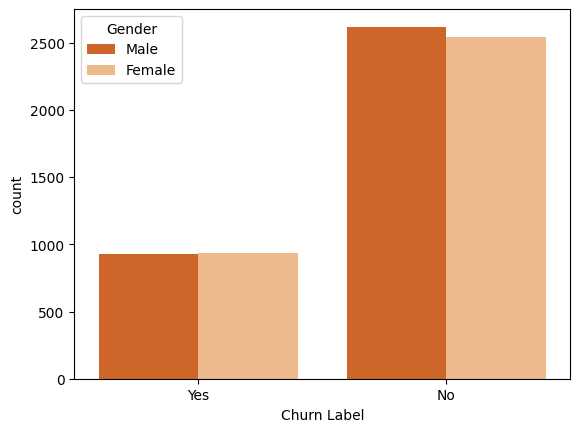

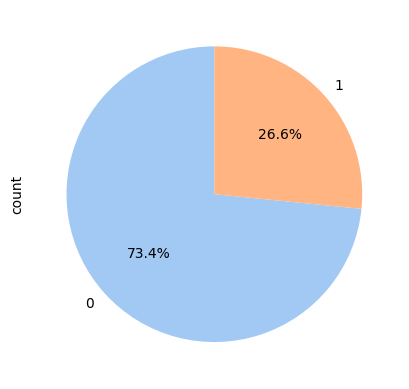

In [54]:
#Countplot of customer churned and retained.
sns.countplot(x='Churn Label',hue="Gender",data=df,palette="Oranges_r")
plt.show()
df['Churn Value'].value_counts().plot.pie(autopct='%1.1f%%',colors=sns.color_palette('pastel'),startangle=90)
plt.show()

From the above pie chart, it is clear that approximately 26.6% of total customers have churned, indicating a significant customer retention challenge for the company.

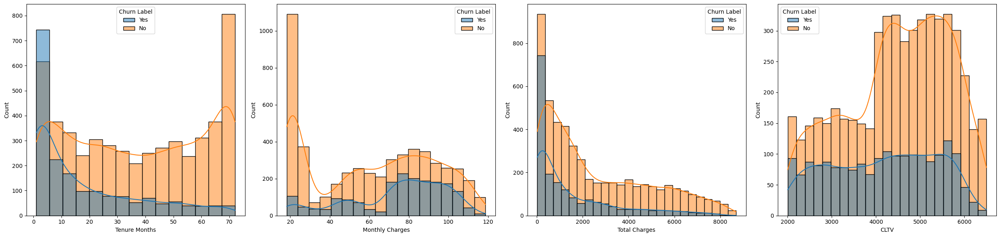

In [67]:
fig, axes = plt.subplots(1, 4, figsize=(25, 6))

sns.histplot(data=df, x='Tenure Months', kde=True, ax=axes[0],color='skyblue',hue='Churn Label')
sns.histplot(data=df, x='Monthly Charges', kde=True, ax=axes[1],color='salmon',hue='Churn Label')
sns.histplot(data=df, x='Total Charges', kde=True, ax=axes[2],color='lightgreen',hue='Churn Label')
sns.histplot(data=df, x='CLTV', kde=True, ax=axes[3],color='orchid',hue='Churn Label')

plt.tight_layout()
plt.show()


# Insights
* Customers with shorter tenure exhibit significantly higher churn behavior compared to long-tenured customers. The probability of churn decreases as tenure increases, indicating stronger loyalty among long-term subscribers.

* Customers with higher monthly charges demonstrate greater churn propensity, suggesting that pricing pressure and perceived service value may significantly influence customer retention decisions.

* Churned customers are primarily concentrated within lower total charge ranges, indicating that many customers discontinue services before generating substantial long-term revenue for the company.

* Customers with higher lifetime value are generally more likely to remain retained, while churned customers exhibit relatively lower long-term value contribution. This highlights the financial importance of customer retention strategies.

Hence we can conclude that,
### HIGH-RISK CHURN CUSTOMERS
* newer customers
* high monthly charge customers
* low total charge customers
* lower lifetime value customers

### LOYAL CUSTOMERS 
* long-tenured customers
* customers generating high cumulative revenue
* higher CLTV customers


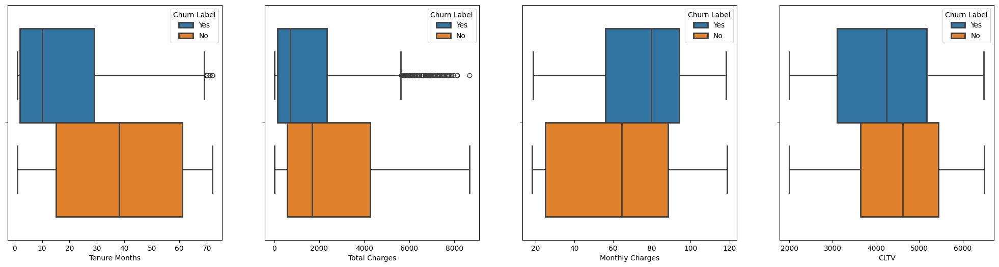

In [77]:
fig, axes = plt.subplots(1, 4, figsize=(25, 6))
sns.boxplot(data=df, x="Tenure Months", hue='Churn Label', ax=axes[0],linewidth=2)
sns.boxplot(data=df, x="Total Charges", hue='Churn Label', ax=axes[1],linewidth=2)
sns.boxplot(data=df, x="Monthly Charges", hue='Churn Label', ax=axes[2],linewidth=2)
sns.boxplot(data=df, x="CLTV", hue='Churn Label', ax=axes[3],linewidth=2)
plt.show()

# Insights
* Churned customers exhibit substantially lower median tenure compared to retained customers, indicating that early-stage customers are significantly more vulnerable to churn. A few high-tenure churn outliers suggest that even loyal customers may discontinue services under certain conditions.

* Retained customers demonstrate significantly higher cumulative charges compared to churned customers, indicating stronger long-term revenue contribution. However, the presence of several high-value churn outliers suggests that even financially valuable customers are not entirely protected from churn risk.

* Churned customers exhibit a higher median monthly charge compared to retained customers, suggesting that pricing pressure may play a substantial role in customer attrition behavior.

* Retained customers generally demonstrate higher customer lifetime value compared to churned customers, although substantial overlap exists between both groups. This suggests that CLTV alone may not be a strong standalone churn discriminator but remains strategically valuable for retention prioritization.

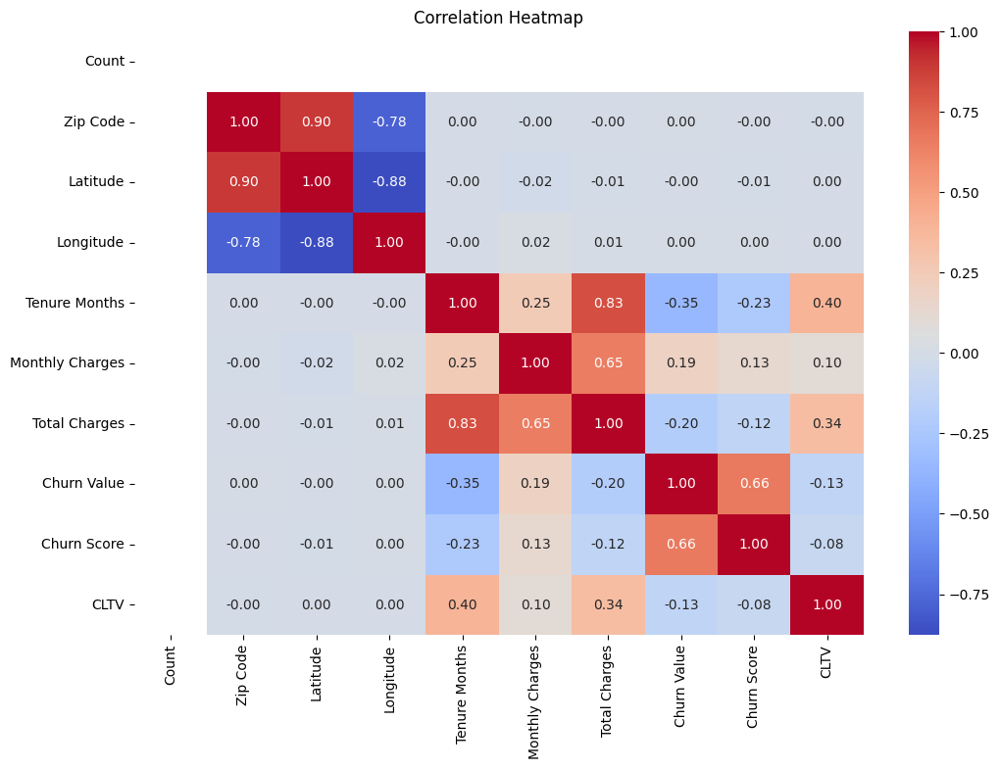

In [83]:
plt.figure(figsize=(12,8))

sns.heatmap(
    df.corr(numeric_only=True),
    annot=True,
    cmap='coolwarm',
    fmt='.2f'
)

plt.title('Correlation Heatmap')
plt.show()

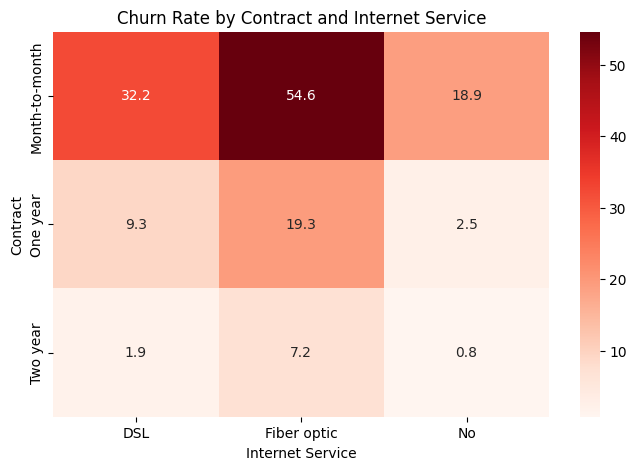

In [84]:
churn_heatmap = pd.crosstab(
    df['Contract'],
    df['Internet Service'],
    values=df['Churn Value'],
    aggfunc='mean'
)*100

plt.figure(figsize=(8,5))

sns.heatmap(
    churn_heatmap,
    annot=True,
    fmt='.1f',
    cmap='Reds'
)

plt.title('Churn Rate by Contract and Internet Service')
plt.show()

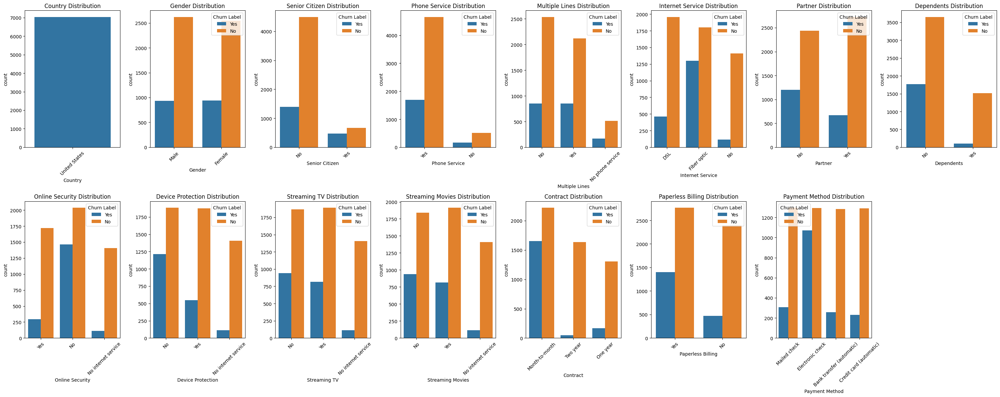

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Create a 2-row, 8-column grid (Total 16 slots, we will use 15)
fig, axes = plt.subplots(2, 8, figsize=(30, 12))

# Flatten the axes array from 2D to 1D so we can use axes[0], axes[1]... easily
axes = axes.flatten()

# 2. Define your list of columns to plot
features = [
    'Country', 'Gender', 'Senior Citizen', 'Phone Service', 'Multiple Lines',
    'Internet Service', 'Partner', 'Dependents', 'Online Security', 
    'Device Protection', 'Streaming TV', 'Streaming Movies', 'Contract', 
    'Paperless Billing', 'Payment Method'
]

# 3. Loop through columns and plot them automatically
for i, col in enumerate(features):
    # 'Country' doesn't need a hue split based on your original code
    if col == 'Country':
        sns.countplot(data=df, x=col, ax=axes[i])
    else:
        sns.countplot(data=df, x=col, hue='Churn Label', ax=axes[i])
    
    # Rotate text labels slightly so they don't overlap
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_title(f'{col} Distribution')

# 4. Hide the 16th empty subplot slot
fig.delaxes(axes[15])

plt.tight_layout()
plt.show()


Write the insight from the above 

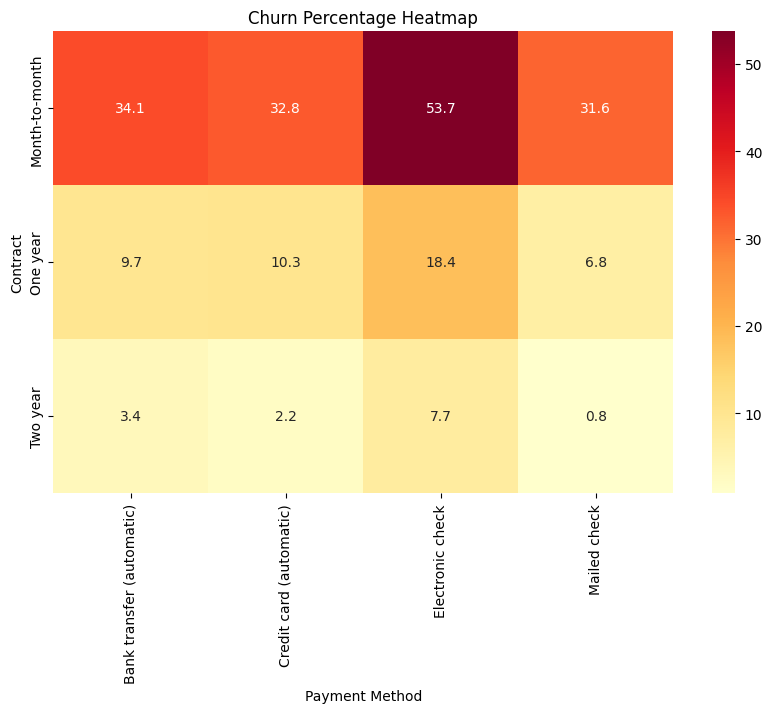

In [85]:
contract_churn = pd.crosstab(
    df['Contract'],
    df['Payment Method'],
    values=df['Churn Value'],
    aggfunc='mean'
)*100

plt.figure(figsize=(10,6))

sns.heatmap(
    contract_churn,
    annot=True,
    fmt='.1f',
    cmap='YlOrRd'
)

plt.title('Churn Percentage Heatmap')
plt.show()

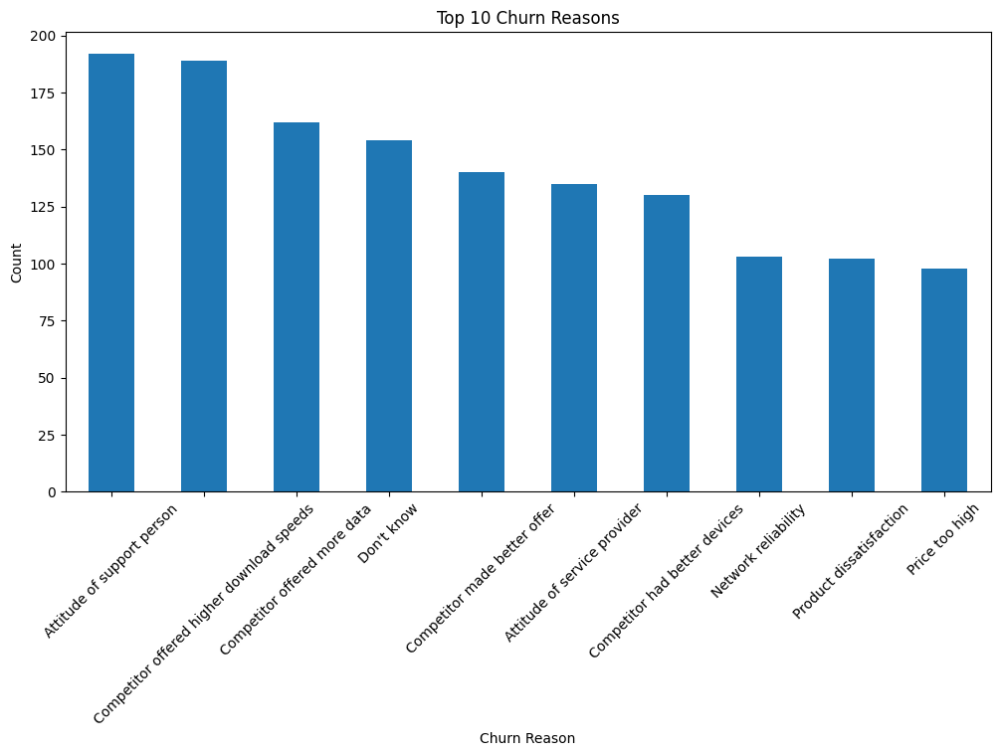

In [87]:
plt.figure(figsize=(12,6))

df['Churn Reason'].value_counts().head(10).plot(kind='bar')

plt.title('Top 10 Churn Reasons')
plt.xlabel('Churn Reason')
plt.ylabel('Count')

plt.xticks(rotation=45)

plt.show()

In [89]:
reason_percent = (
    df['Churn Reason']
    .value_counts(normalize=True)*100
)

reason_percent.head(10)

Churn Reason
Attitude of support person                   10.272873
Competitor offered higher download speeds    10.112360
Competitor offered more data                  8.667737
Don't know                                    8.239700
Competitor made better offer                  7.490637
Attitude of service provider                  7.223114
Competitor had better devices                 6.955591
Network reliability                           5.510968
Product dissatisfaction                       5.457464
Price too high                                5.243446
Name: proportion, dtype: float64

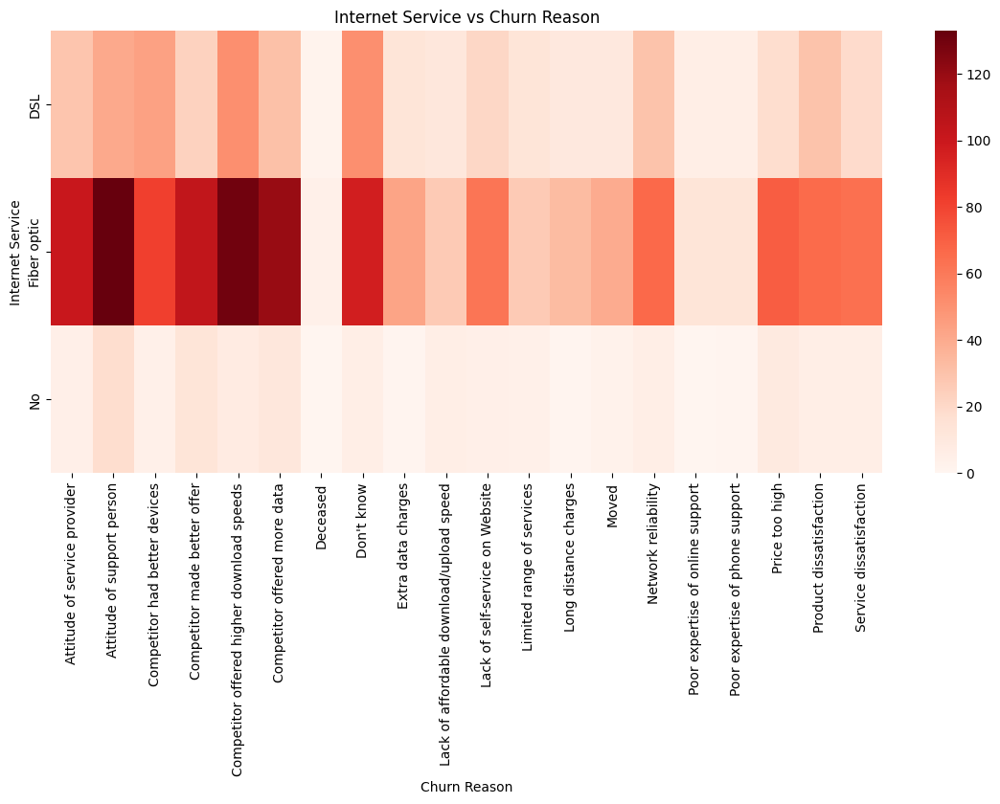

In [90]:
reason_heatmap = pd.crosstab(
    df['Internet Service'],
    df['Churn Reason']
)

plt.figure(figsize=(14,6))

sns.heatmap(reason_heatmap, cmap='Reds')

plt.title('Internet Service vs Churn Reason')

plt.show()

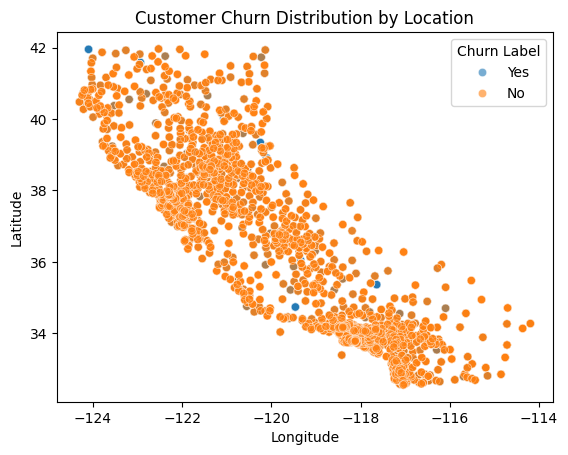

In [91]:
sns.scatterplot(
    data=df,
    x='Longitude',
    y='Latitude',
    hue='Churn Label',
    alpha=0.6
)

plt.title('Customer Churn Distribution by Location')

plt.show()

In [93]:
import folium

# Create base map
m = folium.Map(
    location=[df['Latitude'].mean(), df['Longitude'].mean()],
    zoom_start=6
)

# Add churned customers
for _, row in df.iterrows():
    
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        popup=row['City'],
        color='red',
        fill=True
    ).add_to(m)

m